# Imports

In [1]:
import numpy as np
import pandas as pd
import torch.nn as nn
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torch
import os
from torch import Tensor
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader
from pandas.plotting import scatter_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Model definition

In [2]:
class WineNet(nn.Module):

    def __init__(self):
        super(WineNet, self).__init__()
        
        self.linear = nn.Sequential(
            nn.Linear(in_features=11, out_features=11 * 20),
            nn.BatchNorm1d(11 * 20),
            nn.ReLU(),
            nn.Dropout(0.4),
                       
            nn.Linear(in_features=11 * 20, out_features=11 * 20 * 20),
            nn.BatchNorm1d(11 * 20 * 20),
            nn.ReLU(),
            nn.Dropout(0.4),
            
            nn.Linear(in_features=11 * 20 * 20, out_features=11 * 20),
            nn.BatchNorm1d(11 * 20),
            nn.ReLU(),
            nn.Dropout(0.4),

            nn.Linear(in_features=11 * 20, out_features=6),
        )
        

    def forward(self, x: Tensor) -> Tensor:
        return self.linear(x)

#### Defines trainer

In [3]:
class MyTrainer:
    def __init__(self, model, optimizer, loss_fn, lr_scheduler):
        self.model = model
        self.optimizer = optimizer
        self.loss_fn = loss_fn
        self.lr_scheduler = lr_scheduler
        self._check_optim_net_aligned()

    # Ensures that the given optimizer points to the given model
    def _check_optim_net_aligned(self):
        assert self.optimizer.param_groups[0]['params'] == list(self.model.parameters())

    # Trains the model
    def fit(self,
            train_dataloader: DataLoader,
            test_dataloader: DataLoader,
            epochs: int = 50,
            eval_every: int = 1,
            early_stopping: bool = True,
            sub_epoch_logs: bool = False,
            sub_epoch_percentile: float = 0.1,
            simple_report = False):

        # Stores the current best loss, used to abort training early,
        # helps to prevent over-fitting
        best_loss = 1e9
        # Used to perform sub batch eval
        batch_log_every = len(train_dataloader) * sub_epoch_percentile

        for e in range(epochs):
            if not simple_report:
                # Logs learning rate
                print("Current learning rate: {}".format(self.lr_scheduler.get_last_lr()))
            # Make sure gradient tracking is on, and do a pass over the data
            self.model.train(True)

            # Stores data about the batch
            batch_losses = []
            sub_batch_losses = []

            for i, data in enumerate(train_dataloader):
                # Every data instance is an input + label pair
                inputs, labels = data

                # Zero your gradients for every batch!
                self.optimizer.zero_grad()
                # Make predictions for this batch
                outputs = self.model(inputs.float())
                # Compute the loss and its gradients
                loss = self.loss_fn(outputs, labels)
                loss.backward()
                # Adjust learning weights
                self.optimizer.step()

                # Saves data
                batch_losses.append(loss)
                sub_batch_losses.append(loss)

                # Performs sub batch log
                if sub_epoch_logs and (i + 1) % batch_log_every == 0 and not simple_report:
                    print('Train Epoch: {} [{}/{} ({:.0f}%)]\t\tLoss: {:.6f}'.format(
                        e, (i + 1) * train_dataloader.batch_size,
                        len(train_dataloader) * train_dataloader.batch_size,
                        100.0 * (i + 1) / len(train_dataloader), torch.Tensor(sub_batch_losses).mean()))
                    sub_batch_losses.clear()

            # Adjusts learning rate
            if self.lr_scheduler is not None:
                self.lr_scheduler.step()
            # Reports on the path
            print('Train Epoch: {} Average Loss: {:.6f}'.format(e, torch.Tensor(batch_losses).mean()))

            # Reports on the training progress
            if (e + 1) % eval_every == 0:
                torch.save(self.model.state_dict(), "model_checkpoint_e" + str(e + 1) + ".pt")
                with torch.no_grad():
                    self.model.eval()
                    losses = []
                    for i, data in enumerate(test_dataloader):
                        # Every data instance is an input + label pair
                        inputs, labels = data

                        output = self.model(inputs.float())
                        loss = self.loss_fn(output, labels)
                        losses.append(loss.item())

                    avg_loss = torch.Tensor(losses).mean().item()
                                            
                    if early_stopping:
                        if avg_loss < best_loss:
                            best_loss = avg_loss
                            print("The loss after", (e + 1), "epochs was", round(avg_loss, 4))
                        else:
                            print("The loss after", (e + 1), "epochs was", round(avg_loss, 4))
                            print("The loss had increased since the last checkpoint, aborting training!")
                            # revers to the previse model sice the current one is worse
                            self.model.load_state_dict(torch.load("model_checkpoint_e" + str(e) + ".pt"))
                            break
                    else:
                        print("The loss after", (e + 1), "epochs was:", round(avg_loss, 4))
                    
                    if not simple_report:
                        print()

#### Path management

In [4]:
base: str
if os.getcwd() == "/kaggle/working":
    base = "/kaggle"
else:
    base = os.getcwd()

def get_full_dir(sub_dir: str) -> str:
    return os.path.join(base, sub_dir)

# Loads data

In [5]:
train_path = get_full_dir("input/playground-series-s3e5/train.csv")
test_path = get_full_dir("input/playground-series-s3e5/test.csv")

In [6]:
df_train = pd.read_csv(train_path, index_col='Id')
df_test = pd.read_csv(test_path, index_col='Id')

# Data overview

In [7]:
df_train.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
Id,,,,,,,,,,,,
0,8.0,0.50,0.39,2.2,0.073,30.0,39.0,0.99572,3.33,0.77,12.1,6
1,9.3,0.30,0.73,2.3,0.092,30.0,67.0,0.99854,3.32,0.67,12.8,6
2,7.1,0.51,0.03,2.1,0.059,3.0,12.0,0.99660,3.52,0.73,11.3,7
3,8.1,0.87,0.22,2.6,0.084,11.0,65.0,0.99730,3.20,0.53,9.8,5
4,8.5,0.36,0.30,2.3,0.079,10.0,45.0,0.99444,3.20,1.36,9.5,6


In [8]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2056 entries, 0 to 2055
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         2056 non-null   float64
 1   volatile acidity      2056 non-null   float64
 2   citric acid           2056 non-null   float64
 3   residual sugar        2056 non-null   float64
 4   chlorides             2056 non-null   float64
 5   free sulfur dioxide   2056 non-null   float64
 6   total sulfur dioxide  2056 non-null   float64
 7   density               2056 non-null   float64
 8   pH                    2056 non-null   float64
 9   sulphates             2056 non-null   float64
 10  alcohol               2056 non-null   float64
 11  quality               2056 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 208.8 KB


#### There are no missing vlaues in the data set

In [9]:
df_train.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000,2056.000000
mean,8.365175,0.527601,0.265058,2.398881,0.081856,16.955982,49.236868,0.996748,3.310569,0.641308,10.414972,5.720817
std,1.705390,0.173164,0.188267,0.858824,0.023729,10.009710,32.961141,0.001827,0.142321,0.137942,1.028825,0.853146
min,5.000000,0.180000,0.000000,1.200000,0.012000,1.000000,7.000000,0.990070,2.740000,0.390000,8.700000,3.000000
25%,7.200000,0.390000,0.090000,1.900000,0.071000,8.000000,22.000000,0.995600,3.200000,0.550000,9.500000,5.000000
50%,7.950000,0.520000,0.250000,2.200000,0.079000,16.000000,44.000000,0.996700,3.310000,0.610000,10.100000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,24.000000,65.000000,0.997800,3.390000,0.720000,11.000000,6.000000
max,15.900000,1.580000,0.760000,14.000000,0.414000,68.000000,289.000000,1.003690,3.780000,1.950000,14.000000,8.000000


#### The data is not normalized, we might have to normalize it for some learning methods

<function matplotlib.pyplot.show(close=None, block=None)>

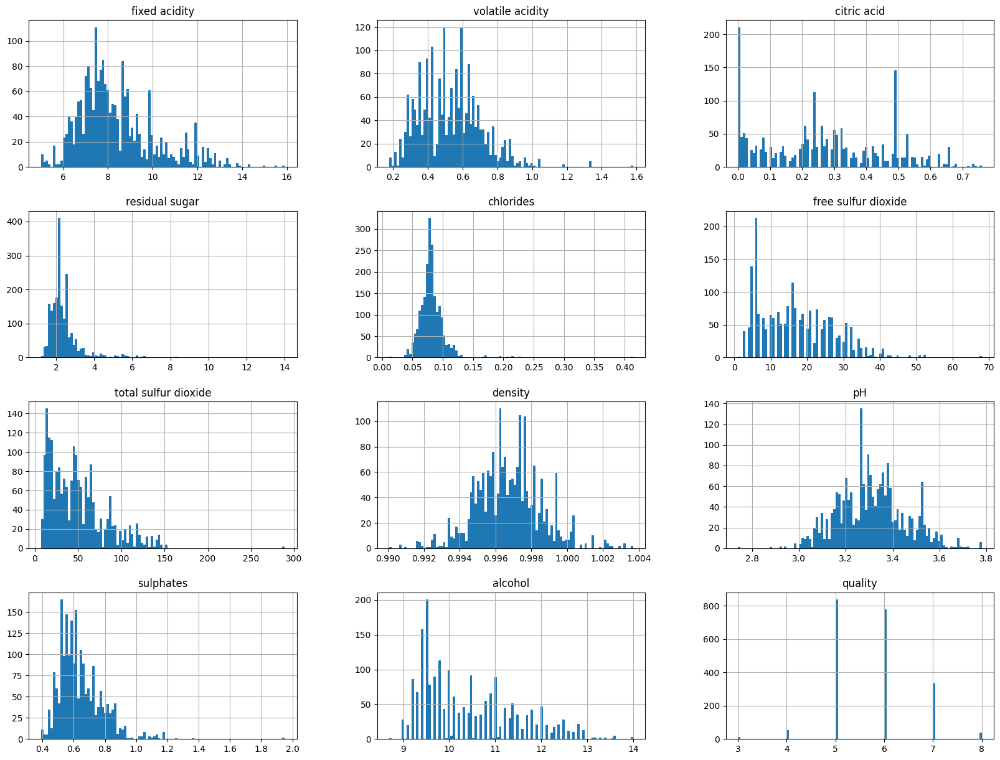

In [10]:
#matplotlib inline
df_train.hist(bins=100, figsize=(20, 15))
plt.show

In [11]:
scatter_matrix(df_train, figsize=(120, 80))
plt.savefig(r"figure_1.png")

#### The image can be downloaded to view in higher quality

In [12]:
df_train['quality'].value_counts()

5    839
6    778
7    333
4     55
8     39
3     12
Name: quality, dtype: int64

#### There is a very large class inbalace, this could result in our model never predicting class 3, 4 or 8. 94.844% of data belongs to class 5, 6 and 7.

#### Defines Target and Features

In [13]:
TARGET = 'quality'
NUM_FEATURES = [c for c in df_train.columns if c not in [TARGET]]

#### Encodes target labels

In [14]:
encoder = LabelEncoder()
y = encoder.fit_transform(df_train[TARGET])

#### Normalizes features

In [15]:
X = df_train.drop("quality", axis=1)
processing = ColumnTransformer([
    ('num', StandardScaler(), NUM_FEATURES)
])
X = processing.fit_transform(X)

# Trains models

In [16]:
models = []
class_weights = torch.tensor([0, 0, 1, 1.07, 2.5, 0])
for i in range (1):
    SKFs = StratifiedKFold(n_splits=5, shuffle=True, random_state=i)
    for fold, (idx_tr, idx_vl) in enumerate(SKFs.split(X, y)):
        print('fold: ' + str(fold))

        train_tensor = TensorDataset(torch.tensor(X[idx_tr]), torch.tensor(y[idx_tr]))
        dev_tensor = TensorDataset(torch.tensor(X[idx_vl]), torch.tensor(y[idx_vl]))

        train_loader = DataLoader(train_tensor, batch_size=16, num_workers=2, shuffle=True)
        dev_loader = DataLoader(dev_tensor, batch_size=16, num_workers=2, shuffle=True)

        model = WineNet()
        loss_function = torch.nn.CrossEntropyLoss(weight = class_weights)
        optimizer = torch.optim.SGD(model.parameters(), lr=0.05, momentum=0.3)
        lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.4)
        trainer = MyTrainer(model, optimizer, loss_function, lr_scheduler)

        trainer.fit(train_loader, dev_loader, epochs=100, eval_every=1, sub_epoch_logs=False, sub_epoch_percentile=0.2, simple_report=True)
        
        models.append(model)

fold: 0
Train Epoch: 0 Average Loss: 1.115415
The loss after 1 epochs was 1.016
Train Epoch: 1 Average Loss: 0.973515
The loss after 2 epochs was 0.949
Train Epoch: 2 Average Loss: 0.922071
The loss after 3 epochs was 0.897
Train Epoch: 3 Average Loss: 0.913820
The loss after 4 epochs was 0.9034
The loss had increased since the last checkpoint, aborting training!
fold: 1
Train Epoch: 0 Average Loss: 1.128656
The loss after 1 epochs was 0.9447
Train Epoch: 1 Average Loss: 0.997239
The loss after 2 epochs was 0.8817
Train Epoch: 2 Average Loss: 0.945134
The loss after 3 epochs was 0.8666
Train Epoch: 3 Average Loss: 0.912650
The loss after 4 epochs was 0.8768
The loss had increased since the last checkpoint, aborting training!
fold: 2
Train Epoch: 0 Average Loss: 1.102683
The loss after 1 epochs was 1.1343
Train Epoch: 1 Average Loss: 0.989283
The loss after 2 epochs was 0.9896
Train Epoch: 2 Average Loss: 0.933230
The loss after 3 epochs was 0.9525
Train Epoch: 3 Average Loss: 0.933163


#### Defines how to make prodictions

In [17]:
def make_predictions(eval_model, data_loader):
    eval_model.eval()
    test_predictions = torch.LongTensor()

    for batch_idx, data in enumerate(data_loader):
        output = eval_model(data.float())
        predictions = torch.max(output, dim=1)[1]
        test_predictions = torch.cat((test_predictions, predictions), dim=0)

    return np.asarray(test_predictions.cpu())

#### Makes prodictions

In [18]:
test_data = processing.transform(df_test)
test_loader = DataLoader(torch.tensor(test_data))
model_predictions = []

for model in models:
    model_predictions.append(make_predictions(model, test_loader))

In [19]:
finale_predictions = np.apply_along_axis(lambda x: np.bincount(x).argmax(), axis=0, arr=np.asarray(model_predictions))
finale_predictions = encoder.inverse_transform(finale_predictions)
submissions = pd.DataFrame({"Id": list(range(2056, 2056 + len(finale_predictions))), "quality": finale_predictions})

In [20]:
pd.DataFrame(submissions).to_csv("submission.csv", index=False, header=True)

# Makes prodictions on train set

In [21]:
full_data = processing.transform(df_train.drop('quality', axis=1))
full_loader = DataLoader(torch.tensor(full_data))

In [22]:
model_predictions = []
for model in models:
    model_predictions.append(make_predictions(model, full_loader))

In [23]:
predictions = np.apply_along_axis(lambda x: np.bincount(x).argmax(), axis=0, arr=np.asarray(model_predictions))
predictions = encoder.inverse_transform(predictions)

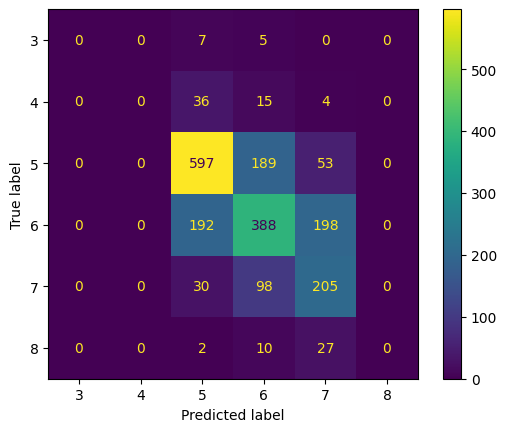

In [24]:
cm = confusion_matrix(df_train['quality'], predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=encoder.classes_)
disp.plot()
plt.show()